## Data Preparation

In [1]:
import os
import tensorflow as tf
import matplotlib.pyplot as plt
import time
import random

In [2]:
PATH = 'KITTI_unet/'
BUFFER_SIZE = 50
BATCH_SIZE  = 1
IMG_WIDTH   = 1024
IMG_HEIGHT  = 256

def load(image_file):
    clean_image = tf.io.read_file(image_file)
    clean_image = tf.image.decode_jpeg(clean_image)
    
    clean_image = tf.image.resize(clean_image, (IMG_HEIGHT, IMG_WIDTH))    
    
    # make input
    noisy_image = tf.identity(clean_image)

    noise_level = 30.0
    n = tf.random.normal((IMG_HEIGHT, IMG_WIDTH, 1))*noise_level 
       
    noisy_image = noisy_image + n
    noisy_image = tf.clip_by_value(noisy_image, clip_value_min=0, clip_value_max=255)

    return noisy_image, clean_image

2023-01-15 13:20:43.556168: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-15 13:20:43.560084: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-15 13:20:43.560183: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-15 13:20:43.579401: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags

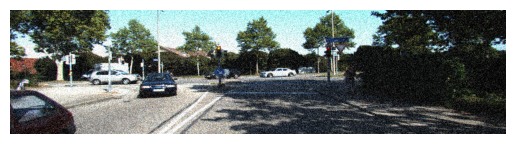

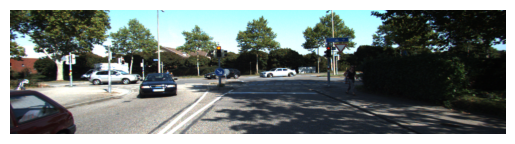

In [3]:
noisy_image, clean_image = load(PATH+'training/000008_10.png')

# casting to int for matplotlib to show the image
plt.figure()
plt.axis('off')
plt.imshow(noisy_image/255.0)

plt.figure()
plt.axis('off')
plt.imshow(clean_image/255.0)

In [6]:
# normalizing the images to [-1, 1]
def normalize(noisy_image, clean_image):
    noisy_image = (noisy_image / 127.5) - 1
    clean_image = (clean_image / 127.5) - 1

    return noisy_image, clean_image

def random_jitter(noisy_image, clean_image):
    if tf.random.uniform(()) > 0.5:
        # random mirroring
        noisy_image = tf.image.flip_left_right(noisy_image)
        clean_image = tf.image.flip_left_right(clean_image)

    return noisy_image, clean_image

def load_image_train(image_file):
    noisy_image, clean_image = load(image_file)
    noisy_image, clean_image = random_jitter(noisy_image, clean_image)
    noisy_image, clean_image = normalize(noisy_image, clean_image)

    return noisy_image, clean_image

def load_image_test(image_file):
    noisy_image, clean_image = load(image_file)
    noisy_image, clean_image = normalize(noisy_image, clean_image)

    return noisy_image, clean_image

In [7]:
# train_dataset
train_dataset = tf.data.Dataset.list_files(PATH+'training/0000*_10.png')
train_dataset = train_dataset.map(load_image_train, num_parallel_calls=tf.data.experimental.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

# test_dataset
test_dataset = tf.data.Dataset.list_files(PATH+'testing/0000*_10.png')
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(1)

In [8]:
# monitor
def display(display_list):
    plt.figure(figsize=(15, 15))

    title = ['Noisy Image', 'True Clean Image', 'Predicted Clean Image']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
            
        plt.axis('off')
    plt.show()

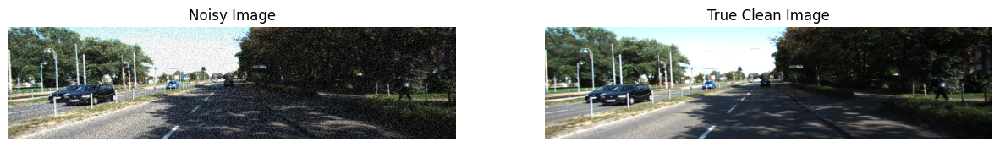

In [9]:
for noisy_image, clean_image in train_dataset.take(1):    
    sample_noisy_image, sample_clean_image = noisy_image[0], clean_image[0]
    display([sample_noisy_image, sample_clean_image])

## Model

In [13]:
inputs = tf.keras.layers.Input(shape=[256, 1024, 3])    
x = inputs  

# block 1
x = tf.keras.layers.Conv2D(64, 4, padding='same', activation='LeakyReLU')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.MaxPooling2D()(x)

pre1 = x

# block 2
x = tf.keras.layers.Conv2D(128, 4, padding='same', activation='LeakyReLU')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.MaxPooling2D()(x)

pre2 = x

# block 3
x = tf.keras.layers.Conv2D(256, 4, padding='same', activation='LeakyReLU')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.MaxPooling2D()(x)

pre3 = x

# block 4
x = tf.keras.layers.Conv2D(512, 4, padding='same', activation='LeakyReLU')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.MaxPooling2D()(x)

pre4 = x

# block 5
x = tf.keras.layers.Conv2D(512, 4, padding='same', activation='LeakyReLU')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.MaxPooling2D()(x)

# upsampling
x = tf.keras.layers.Conv2DTranspose(512, 4, padding='same', strides=2, activation='LeakyReLU')(x)
x = tf.keras.layers.BatchNormalization()(x)

x = tf.keras.layers.Add()([x, pre4])

# upsampling
x = tf.keras.layers.Conv2DTranspose(256, 4, padding='same', strides=2, activation='LeakyReLU')(x)
x = tf.keras.layers.BatchNormalization()(x)

x = tf.keras.layers.Add()([x, pre3])

# upsampling
x = tf.keras.layers.Conv2DTranspose(128, 4, padding='same', strides=2, activation='LeakyReLU')(x)
x = tf.keras.layers.BatchNormalization()(x)

x = tf.keras.layers.Add()([x, pre2])

# upsampling
x = tf.keras.layers.Conv2DTranspose(64, 4, padding='same', strides=2, activation='LeakyReLU')(x)
x = tf.keras.layers.BatchNormalization()(x)

x = tf.keras.layers.Add()([x, pre1])

# upsampling
x = tf.keras.layers.Conv2DTranspose(3, 4, strides=2, padding='same', activation='tanh')(x)

model = tf.keras.Model(inputs=[inputs], outputs=[x])
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 256, 1024,   0           []                               
                                3)]                                                               
                                                                                                  
 conv2d_5 (Conv2D)              (None, 256, 1024, 6  3136        ['input_2[0][0]']                
                                4)                                                                
                                                                                                  
 batch_normalization_9 (BatchNo  (None, 256, 1024, 6  256        ['conv2d_5[0][0]']               
 rmalization)                   4)                                                          

                                                                                                  
 conv2d_transpose_9 (Conv2DTran  (None, 256, 1024, 3  3075       ['add_7[0][0]']                  
 spose)                         )                                                                 
                                                                                                  
Total params: 13,911,939
Trainable params: 13,907,075
Non-trainable params: 4,864
__________________________________________________________________________________________________


## Train

In [16]:
model.compile(optimizer='adam', loss=tf.keras.losses.MeanSquaredError())

def show_predictions(dataset=None, num=1):
    predicted_image = model.predict(sample_noisy_image[tf.newaxis, ...])
    display([sample_noisy_image, sample_clean_image, predicted_image[0]])
        
class DisplayCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):        
        show_predictions()
        print ('\nSample Prediction after epoch {}\n'.format(epoch+1))

Epoch 1/20
 99/100 [============================>.] - ETA: 0s - loss: 0.0422

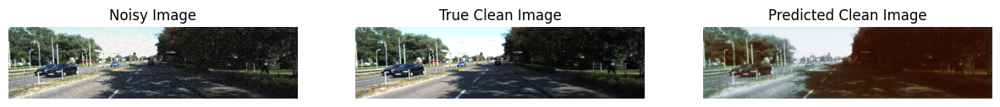


Sample Prediction after epoch 1

100/100 [==============================] - 5s 42ms/step - loss: 0.0419
Epoch 2/20
100/100 [==============================] - ETA: 0s - loss: 0.0343

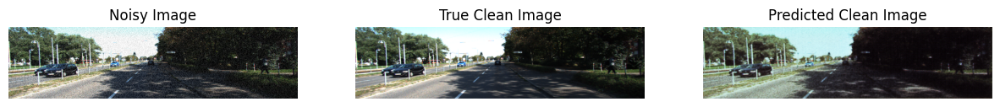


Sample Prediction after epoch 2

100/100 [==============================] - 4s 40ms/step - loss: 0.0343
Epoch 3/20
 99/100 [============================>.] - ETA: 0s - loss: 0.0305

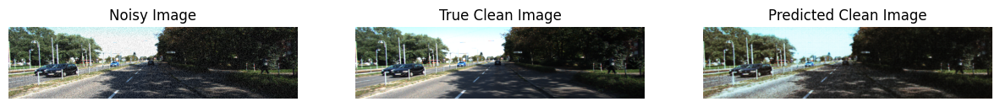


Sample Prediction after epoch 3

100/100 [==============================] - 4s 40ms/step - loss: 0.0305
Epoch 4/20
100/100 [==============================] - ETA: 0s - loss: 0.0295

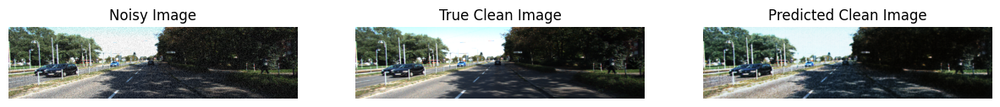


Sample Prediction after epoch 4

100/100 [==============================] - 4s 40ms/step - loss: 0.0295
Epoch 5/20
 99/100 [============================>.] - ETA: 0s - loss: 0.0277

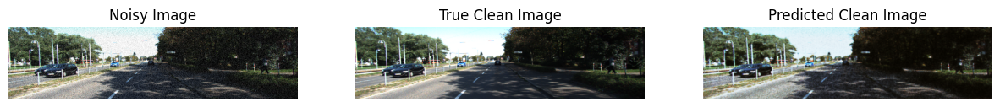


Sample Prediction after epoch 5

100/100 [==============================] - 4s 40ms/step - loss: 0.0276
Epoch 6/20
100/100 [==============================] - ETA: 0s - loss: 0.0274

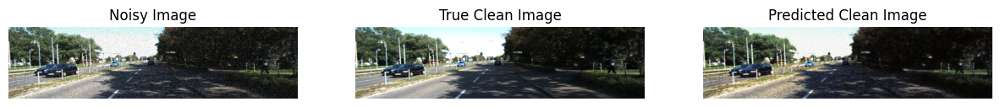


Sample Prediction after epoch 6

100/100 [==============================] - 4s 40ms/step - loss: 0.0274
Epoch 7/20
 99/100 [============================>.] - ETA: 0s - loss: 0.0254

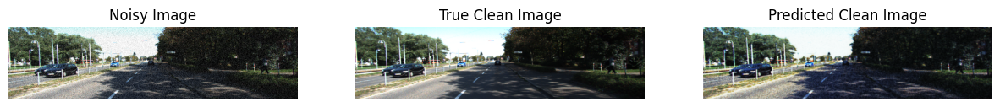


Sample Prediction after epoch 7

100/100 [==============================] - 4s 40ms/step - loss: 0.0253
Epoch 8/20
100/100 [==============================] - ETA: 0s - loss: 0.0229

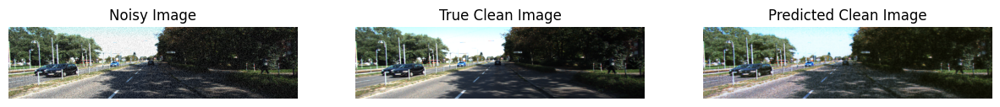


Sample Prediction after epoch 8

100/100 [==============================] - 4s 40ms/step - loss: 0.0229
Epoch 9/20
 99/100 [============================>.] - ETA: 0s - loss: 0.0240

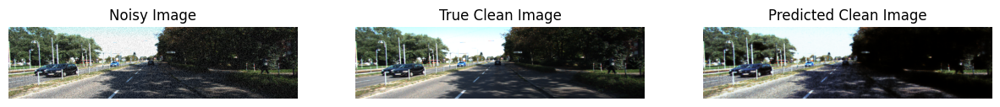


Sample Prediction after epoch 9

100/100 [==============================] - 4s 40ms/step - loss: 0.0239
Epoch 10/20
100/100 [==============================] - ETA: 0s - loss: 0.0207

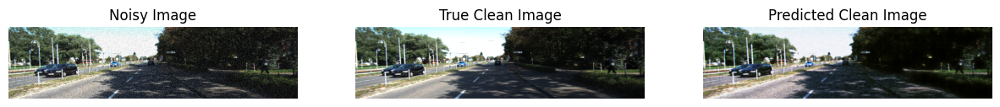


Sample Prediction after epoch 10

100/100 [==============================] - 4s 40ms/step - loss: 0.0207
Epoch 11/20
 99/100 [============================>.] - ETA: 0s - loss: 0.0217

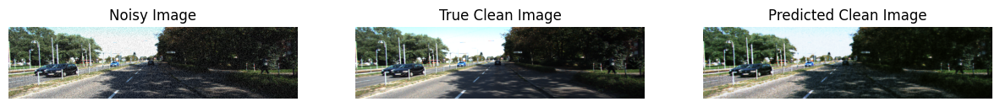


Sample Prediction after epoch 11

100/100 [==============================] - 4s 40ms/step - loss: 0.0216
Epoch 12/20
100/100 [==============================] - ETA: 0s - loss: 0.0223

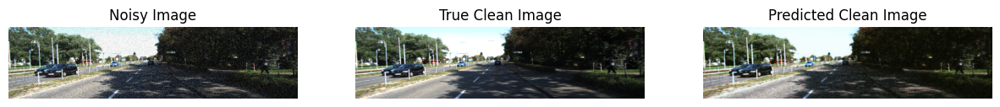


Sample Prediction after epoch 12

100/100 [==============================] - 4s 40ms/step - loss: 0.0223
Epoch 13/20
 99/100 [============================>.] - ETA: 0s - loss: 0.0210

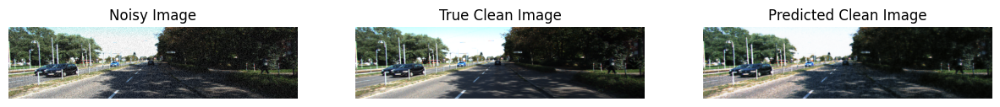


Sample Prediction after epoch 13

100/100 [==============================] - 4s 42ms/step - loss: 0.0210
Epoch 14/20
100/100 [==============================] - ETA: 0s - loss: 0.0187

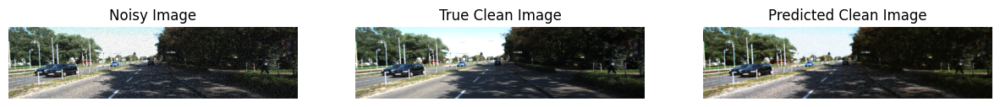


Sample Prediction after epoch 14

100/100 [==============================] - 4s 40ms/step - loss: 0.0187
Epoch 15/20
 99/100 [============================>.] - ETA: 0s - loss: 0.0205

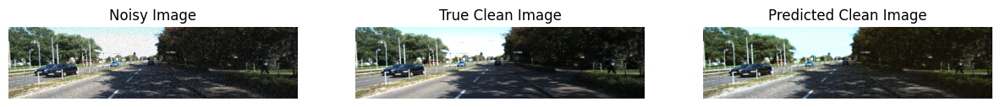


Sample Prediction after epoch 15

100/100 [==============================] - 4s 40ms/step - loss: 0.0204
Epoch 16/20
 99/100 [============================>.] - ETA: 0s - loss: 0.0183

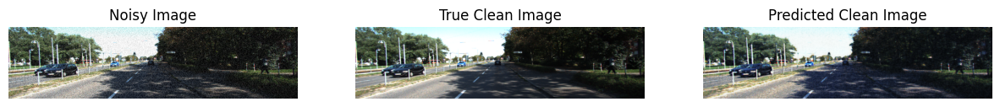


Sample Prediction after epoch 16

100/100 [==============================] - 4s 40ms/step - loss: 0.0183
Epoch 17/20
100/100 [==============================] - ETA: 0s - loss: 0.0171

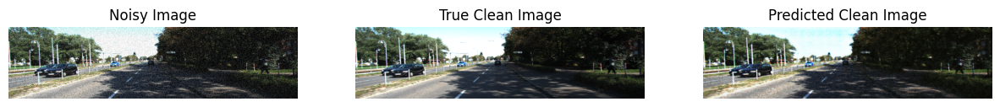


Sample Prediction after epoch 17

100/100 [==============================] - 4s 40ms/step - loss: 0.0171
Epoch 18/20
100/100 [==============================] - ETA: 0s - loss: 0.0169

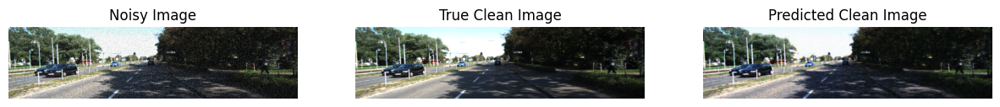


Sample Prediction after epoch 18

100/100 [==============================] - 4s 40ms/step - loss: 0.0169
Epoch 19/20
 99/100 [============================>.] - ETA: 0s - loss: 0.0161

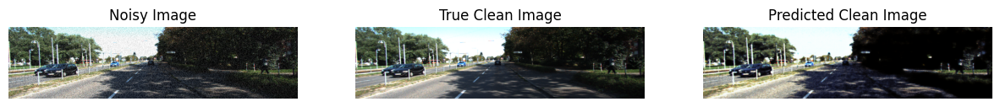


Sample Prediction after epoch 19

100/100 [==============================] - 4s 40ms/step - loss: 0.0162
Epoch 20/20
 99/100 [============================>.] - ETA: 0s - loss: 0.0165

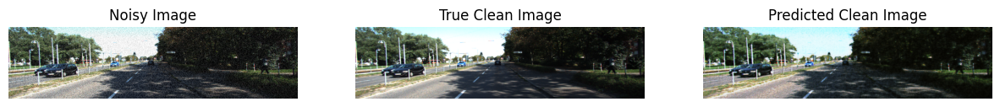


Sample Prediction after epoch 20

100/100 [==============================] - 4s 41ms/step - loss: 0.0165


In [17]:
EPOCHS = 20

model_history = model.fit(train_dataset, epochs=EPOCHS, callbacks=[DisplayCallback()])

Epoch 1/20
100/100 [==============================] - ETA: 0s - loss: 0.0164

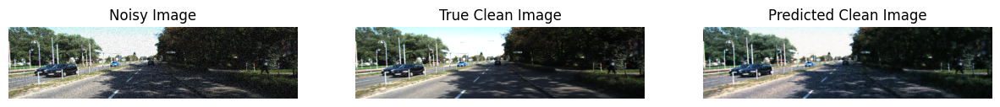


Sample Prediction after epoch 1

100/100 [==============================] - 5s 42ms/step - loss: 0.0164
Epoch 2/20
100/100 [==============================] - ETA: 0s - loss: 0.0153

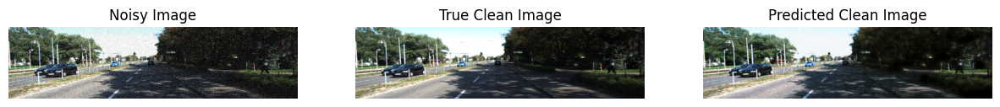


Sample Prediction after epoch 2

100/100 [==============================] - 4s 40ms/step - loss: 0.0153
Epoch 3/20
 99/100 [============================>.] - ETA: 0s - loss: 0.0166

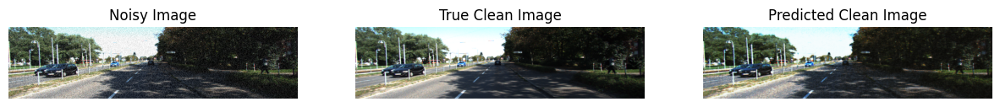


Sample Prediction after epoch 3

100/100 [==============================] - 4s 41ms/step - loss: 0.0166
Epoch 4/20
 99/100 [============================>.] - ETA: 0s - loss: 0.0157

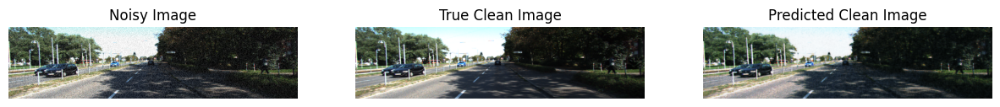


Sample Prediction after epoch 4

100/100 [==============================] - 4s 40ms/step - loss: 0.0157
Epoch 5/20
 99/100 [============================>.] - ETA: 0s - loss: 0.0158

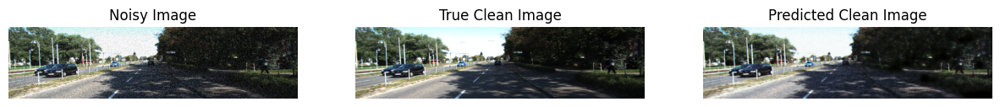


Sample Prediction after epoch 5

100/100 [==============================] - 4s 41ms/step - loss: 0.0157
Epoch 6/20
100/100 [==============================] - ETA: 0s - loss: 0.0143

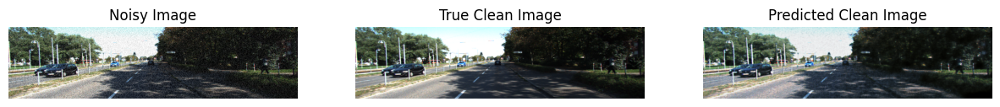


Sample Prediction after epoch 6

100/100 [==============================] - 4s 40ms/step - loss: 0.0143
Epoch 7/20
100/100 [==============================] - ETA: 0s - loss: 0.0155

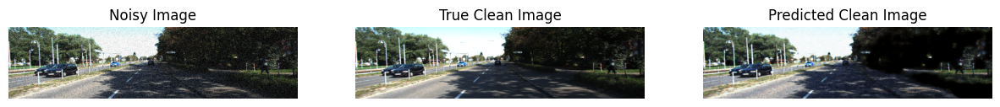


Sample Prediction after epoch 7

100/100 [==============================] - 4s 41ms/step - loss: 0.0155
Epoch 8/20
100/100 [==============================] - ETA: 0s - loss: 0.0137

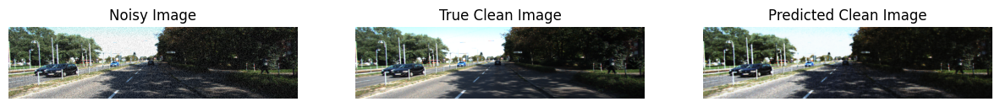


Sample Prediction after epoch 8

100/100 [==============================] - 4s 42ms/step - loss: 0.0137
Epoch 9/20
100/100 [==============================] - ETA: 0s - loss: 0.0140

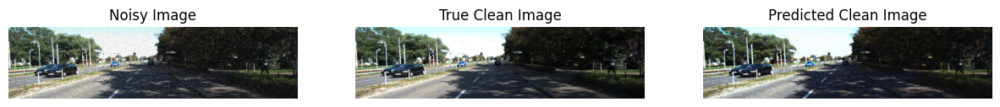


Sample Prediction after epoch 9

100/100 [==============================] - 4s 40ms/step - loss: 0.0140
Epoch 10/20
100/100 [==============================] - ETA: 0s - loss: 0.0147

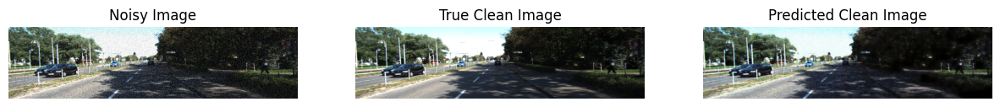


Sample Prediction after epoch 10

100/100 [==============================] - 4s 41ms/step - loss: 0.0147
Epoch 11/20
100/100 [==============================] - ETA: 0s - loss: 0.0144

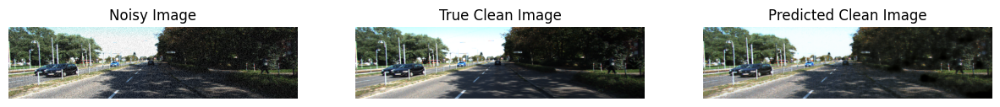


Sample Prediction after epoch 11

100/100 [==============================] - 4s 41ms/step - loss: 0.0144
Epoch 12/20
100/100 [==============================] - ETA: 0s - loss: 0.0135

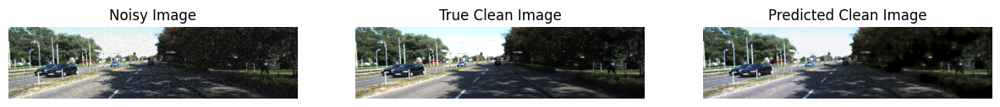


Sample Prediction after epoch 12

100/100 [==============================] - 4s 40ms/step - loss: 0.0135
Epoch 13/20
100/100 [==============================] - ETA: 0s - loss: 0.0148

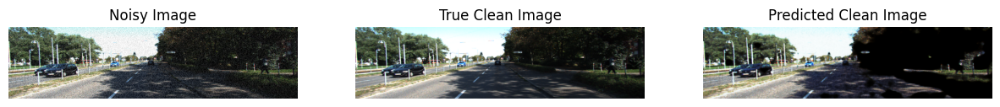


Sample Prediction after epoch 13

100/100 [==============================] - 4s 40ms/step - loss: 0.0148
Epoch 14/20
100/100 [==============================] - ETA: 0s - loss: 0.0137

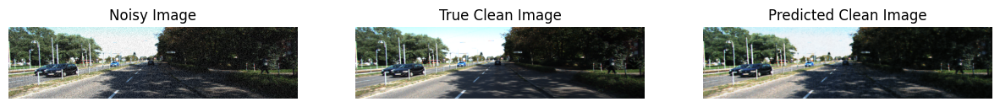


Sample Prediction after epoch 14

100/100 [==============================] - 4s 41ms/step - loss: 0.0137
Epoch 15/20
 99/100 [============================>.] - ETA: 0s - loss: 0.0124

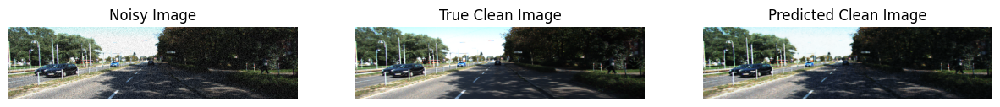


Sample Prediction after epoch 15

100/100 [==============================] - 4s 41ms/step - loss: 0.0124
Epoch 16/20
 99/100 [============================>.] - ETA: 0s - loss: 0.0141

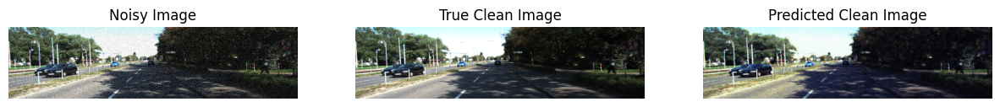


Sample Prediction after epoch 16

100/100 [==============================] - 4s 41ms/step - loss: 0.0141
Epoch 17/20
 99/100 [============================>.] - ETA: 0s - loss: 0.0132

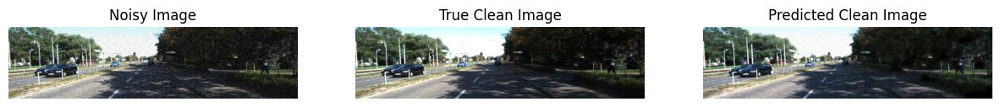


Sample Prediction after epoch 17

100/100 [==============================] - 4s 40ms/step - loss: 0.0131
Epoch 18/20
100/100 [==============================] - ETA: 0s - loss: 0.0122

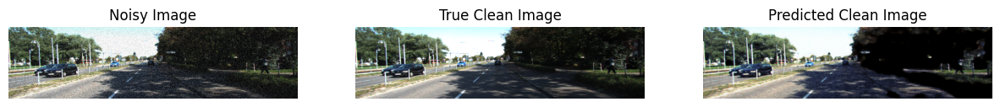


Sample Prediction after epoch 18

100/100 [==============================] - 4s 40ms/step - loss: 0.0122
Epoch 19/20
100/100 [==============================] - ETA: 0s - loss: 0.0122

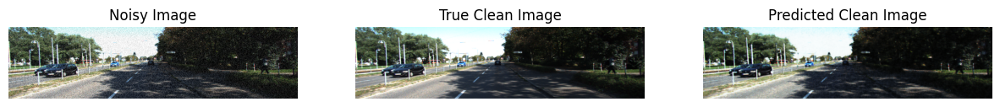


Sample Prediction after epoch 19

100/100 [==============================] - 4s 41ms/step - loss: 0.0122
Epoch 20/20
100/100 [==============================] - ETA: 0s - loss: 0.0130

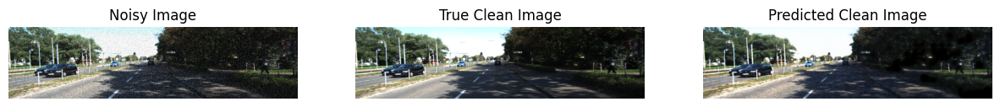


Sample Prediction after epoch 20

100/100 [==============================] - 4s 41ms/step - loss: 0.0130


In [18]:
tf.keras.optimizers.Adam(learning_rate=0.00001)
model.compile(optimizer='adam', loss=tf.keras.losses.MeanSquaredError())

EPOCHS = 20

model_history = model.fit(train_dataset, epochs=EPOCHS, callbacks=[DisplayCallback()])

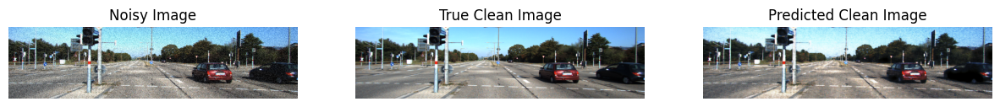

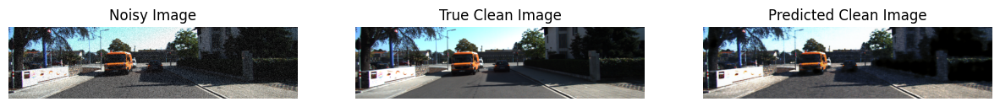

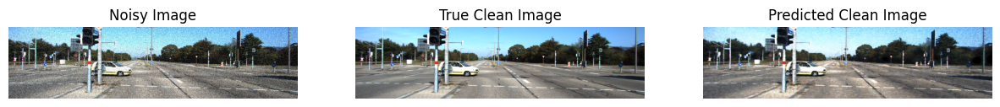

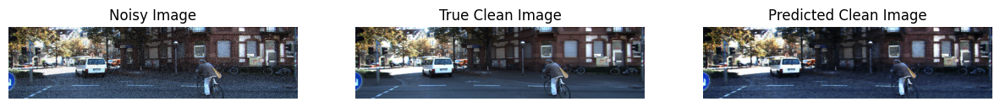

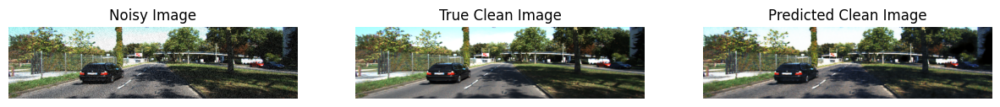

In [20]:
for noisy_image, clean_image in train_dataset.take(5):
    predicted_image = model.predict(noisy_image)
    display([noisy_image[0], clean_image[0], predicted_image[0]])

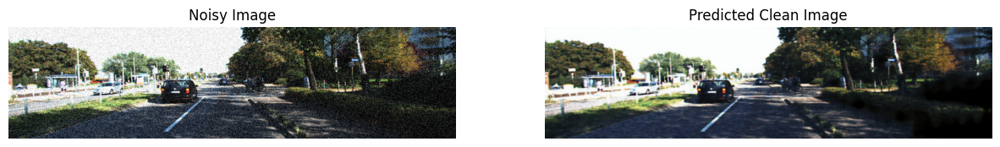

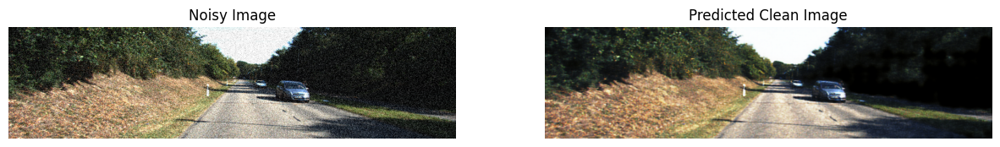

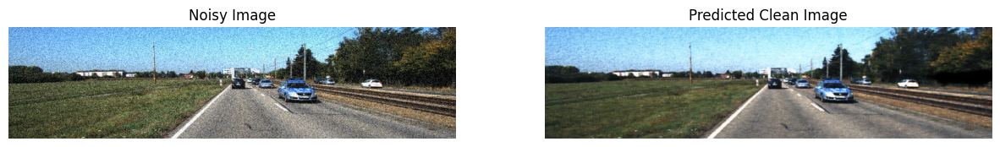

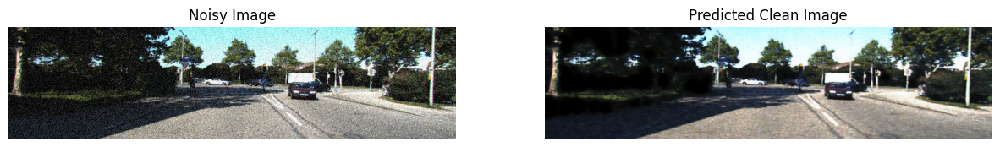

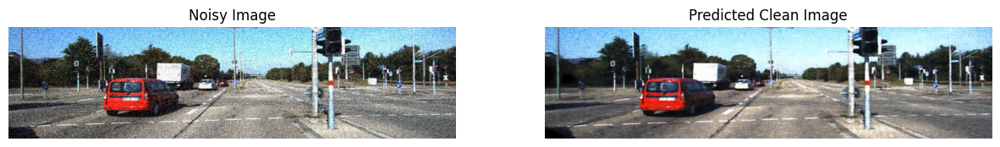

In [21]:
# monitor
def display2(display_list):
    plt.figure(figsize=(15, 15))

    title = ['Noisy Image', 'Predicted Clean Image']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
            
        plt.axis('off')
    plt.show()

for noisy_image, clean_image in test_dataset.take(5):
    predicted_image = model.predict(noisy_image)
    display2([noisy_image[0], predicted_image[0]])